In [40]:
import os
import shutil
from sklearn.model_selection import train_test_split

# ====================================================
# Paths
# ====================================================
input_dir = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\Real"

output_dir = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\SplitReal"

image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff')

# ====================================================
# Read all images
# ====================================================
image_paths = []
labels = []

classes = sorted(os.listdir(input_dir))

for cls in classes:

    class_path = os.path.join(input_dir, cls)

    if not os.path.isdir(class_path):
        continue

    images = [f for f in os.listdir(class_path)
              if f.lower().endswith(image_extensions)]

    for img in images:
        image_paths.append(os.path.join(class_path, img))
        labels.append(cls)

print(f"Total Images : {len(image_paths)}")

# ====================================================
# Create 5 Different Random Splits
# ====================================================
for fold in range(1, 6):

    print(f"\n========== Fold {fold} ==========")

    # ----------- 80% Train / 20% Temp -----------
    train_imgs, temp_imgs, train_labels, temp_labels = train_test_split(
        image_paths,
        labels,
        test_size=0.20,
        stratify=labels,
        random_state=100 + fold,
        shuffle=True
    )

    # ----------- Split Temp into Val/Test (10% + 10%) -----------
    val_imgs, test_imgs, val_labels, test_labels = train_test_split(
        temp_imgs,
        temp_labels,
        test_size=0.50,
        stratify=temp_labels,
        random_state=100 + fold,
        shuffle=True
    )

    fold_dir = os.path.join(output_dir, f"Fold_{fold}")

    train_dir = os.path.join(fold_dir, "Train")
    val_dir = os.path.join(fold_dir, "Validation")
    test_dir = os.path.join(fold_dir, "Test")

    # Create folders
    for cls in classes:
        os.makedirs(os.path.join(train_dir, cls), exist_ok=True)
        os.makedirs(os.path.join(val_dir, cls), exist_ok=True)
        os.makedirs(os.path.join(test_dir, cls), exist_ok=True)

    # Copy Train
    for img, cls in zip(train_imgs, train_labels):
        shutil.copy2(img, os.path.join(train_dir, cls, os.path.basename(img)))

    # Copy Validation
    for img, cls in zip(val_imgs, val_labels):
        shutil.copy2(img, os.path.join(val_dir, cls, os.path.basename(img)))

    # Copy Test
    for img, cls in zip(test_imgs, test_labels):
        shutil.copy2(img, os.path.join(test_dir, cls, os.path.basename(img)))

    print(f"Train      : {len(train_imgs)}")
    print(f"Validation : {len(val_imgs)}")
    print(f"Test       : {len(test_imgs)}")

print("\nAll 5 folds created successfully.")

Total Images : 4072

========== Fold 1 ==========
Train      : 3257
Validation : 407
Test       : 408

========== Fold 2 ==========
Train      : 3257
Validation : 407
Test       : 408

========== Fold 3 ==========
Train      : 3257
Validation : 407
Test       : 408

========== Fold 4 ==========
Train      : 3257
Validation : 407
Test       : 408

========== Fold 5 ==========
Train      : 3257
Validation : 407
Test       : 408

All 5 folds created successfully.


In [1]:
!pip install tensorflow keras pandas numpy scipy matplotlib scikit-learn pillow tqdm

In [6]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm

from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
##############################################
# CHANGE THESE PATHS
##############################################

REAL_DIR = "D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\SplitReal\Fold_2\Train"

GENERATED_DIR = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\PL-LDGANGnereated"

OUTPUT_DIR = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\PL-LDGANFOLD2_NN_ANALYSIS"

os.makedirs(OUTPUT_DIR, exist_ok=True)

In [7]:
model = ResNet50(
    weights='imagenet',
    include_top=False,
    pooling='avg'
)

print("ResNet50 Loaded Successfully")

ResNet50 Loaded Successfully


In [8]:
IMG_SIZE = 224

def preprocess_image(path):

    img = cv2.imread(path)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img = cv2.resize(img,(IMG_SIZE,IMG_SIZE))

    img = img_to_array(img)

    img = preprocess_input(img)

    return img

In [9]:
def extract_folder_features(folder):

    features=[]

    labels=[]

    image_paths=[]

    classes=sorted(os.listdir(folder))

    print(classes)

    for cls in classes:

        class_path=os.path.join(folder,cls)

        if not os.path.isdir(class_path):
            continue

        images=os.listdir(class_path)

        print(f"{cls} : {len(images)} images")

        for img_name in tqdm(images):

            path=os.path.join(class_path,img_name)

            try:

                img=preprocess_image(path)

                img=np.expand_dims(img,axis=0)

                feat=model.predict(img,verbose=0)[0]

                features.append(feat)

                labels.append(cls)

                image_paths.append(path)

            except:

                continue

    return np.array(features),labels,image_paths

In [10]:
real_features,real_labels,real_paths = extract_folder_features(REAL_DIR)

print(real_features.shape)

['EarlyBlight', 'Healthy', 'LateBlight']
EarlyBlight : 1302 images


100%|██████████████████████████████████████████████████████████████████████████████| 1302/1302 [02:38<00:00,  8.21it/s]


Healthy : 816 images


100%|████████████████████████████████████████████████████████████████████████████████| 816/816 [01:40<00:00,  8.15it/s]


LateBlight : 1139 images


100%|██████████████████████████████████████████████████████████████████████████████| 1139/1139 [02:20<00:00,  8.11it/s]

(3257, 2048)


In [11]:
generated_features,generated_labels,generated_paths = extract_folder_features(GENERATED_DIR)

print(generated_features.shape)

['EarlyBlight', 'Healthy', 'LateBlight']
EarlyBlight : 5000 images


100%|██████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:53<00:00,  7.65it/s]


Healthy : 5000 images


100%|██████████████████████████████████████████████████████████████████████████████| 5000/5000 [11:24<00:00,  7.31it/s]


LateBlight : 5000 images


 94%|█████████████████████████████████████████████████████████████████████████▌    | 4713/5000 [10:37<00:38,  7.49it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [12]:
###############################################
# SAVE FEATURES
###############################################

np.save(os.path.join(OUTPUT_DIR,"real_features.npy"),real_features)

np.save(os.path.join(OUTPUT_DIR,"generated_features.npy"),generated_features)

np.save(os.path.join(OUTPUT_DIR,"real_labels.npy"),np.array(real_labels))

np.save(os.path.join(OUTPUT_DIR,"generated_labels.npy"),np.array(generated_labels))

np.save(os.path.join(OUTPUT_DIR,"real_paths.npy"),np.array(real_paths))

np.save(os.path.join(OUTPUT_DIR,"generated_paths.npy"),np.array(generated_paths))

In [13]:
print("=====================================")

print("Feature Extraction Completed")

print()

print("Real Images :",len(real_paths))

print("Generated Images :",len(generated_paths))

print()

print("Saved Files:")

print("real_features.npy")

print("generated_features.npy")

print("real_labels.npy")

print("generated_labels.npy")

print("real_paths.npy")

print("generated_paths.npy")

print("=====================================")

Feature Extraction Completed

Real Images : 3257
Generated Images : 15000

Saved Files:
real_features.npy
generated_features.npy
real_labels.npy
generated_labels.npy
real_paths.npy
generated_paths.npy


In [14]:
def count_images(folder):
    total = 0
    for root, dirs, files in os.walk(folder):
        total += sum(f.lower().endswith(('.jpg','.jpeg','.png','.bmp','.tif','.tiff'))
                     for f in files)
    return total

print("Real Images      :", count_images(REAL_DIR))
print("Generated Images :", count_images(GENERATED_DIR))

Real Images      : 3257
Generated Images : 15000


In [15]:
import os
import numpy as np
import pandas as pd
from sklearn.neighbors import NearestNeighbors
from tqdm import tqdm
###############################################
# PATH
###############################################

FEATURE_DIR = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\PL-LDGANFOLD2_NN_ANALYSIS"

In [16]:
real_features = np.load(os.path.join(FEATURE_DIR,"real_features.npy"))
generated_features = np.load(os.path.join(FEATURE_DIR,"generated_features.npy"))

real_labels = np.load(os.path.join(FEATURE_DIR,"real_labels.npy"))
generated_labels = np.load(os.path.join(FEATURE_DIR,"generated_labels.npy"))

real_paths = np.load(os.path.join(FEATURE_DIR,"real_paths.npy"))
generated_paths = np.load(os.path.join(FEATURE_DIR,"generated_paths.npy"))

print(real_features.shape)
print(generated_features.shape)

(3257, 2048)
(15000, 2048)


In [17]:
##############################################
# Generated --> Real
##############################################

nn = NearestNeighbors(
    n_neighbors=1,
    metric='cosine',
    algorithm='brute'
)

nn.fit(real_features)

distances, indices = nn.kneighbors(generated_features)

GR = pd.DataFrame({

    "Generated_Path":generated_paths,

    "Generated_Label":generated_labels,

    "Nearest_Real_Path":real_paths[indices.flatten()],

    "Nearest_Real_Label":real_labels[indices.flatten()],

    "Distance":distances.flatten()

})

GR.to_csv(
    os.path.join(FEATURE_DIR,"Generated_to_Real.csv"),
    index=False
)

print(GR.head())

                                      Generated_Path Generated_Label  \
0  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...     EarlyBlight   
1  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...     EarlyBlight   
2  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...     EarlyBlight   
3  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...     EarlyBlight   
4  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...     EarlyBlight   

                                   Nearest_Real_Path Nearest_Real_Label  \
0  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...        EarlyBlight   
1  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...        EarlyBlight   
2  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...        EarlyBlight   
3  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...        EarlyBlight   
4  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...        EarlyBlight   

   Distance  
0  0.016391  
1  0.006935  
2  0.009275  
3  0.006965  
4  0.003802  


In [18]:
##############################################
# Real --> Real
##############################################

nn = NearestNeighbors(
    n_neighbors=2,
    metric='cosine',
    algorithm='brute'
)

nn.fit(real_features)

distances, indices = nn.kneighbors(real_features)

RR = pd.DataFrame({

    "Real_Path":real_paths,

    "Real_Label":real_labels,

    "Nearest_Real_Path":real_paths[indices[:,1]],

    "Nearest_Real_Label":real_labels[indices[:,1]],

    "Distance":distances[:,1]

})

RR.to_csv(
    os.path.join(FEATURE_DIR,"Real_to_Real.csv"),
    index=False
)

print(RR.head())

                                           Real_Path   Real_Label  \
0  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...  EarlyBlight   
1  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...  EarlyBlight   
2  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...  EarlyBlight   
3  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...  EarlyBlight   
4  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...  EarlyBlight   

                                   Nearest_Real_Path Nearest_Real_Label  \
0  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...        EarlyBlight   
1  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...        EarlyBlight   
2  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...        EarlyBlight   
3  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...        EarlyBlight   
4  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...        EarlyBlight   

   Distance  
0  0.093577  
1  0.094212  
2  0.063143  
3  0.128708  
4  0.143157  


In [19]:
##############################################
# Generated --> Generated
##############################################

nn = NearestNeighbors(
    n_neighbors=2,
    metric='cosine',
    algorithm='brute'
)

nn.fit(generated_features)

distances, indices = nn.kneighbors(generated_features)

GG = pd.DataFrame({

    "Generated_Path":generated_paths,

    "Generated_Label":generated_labels,

    "Nearest_Generated_Path":generated_paths[indices[:,1]],

    "Nearest_Generated_Label":generated_labels[indices[:,1]],

    "Distance":distances[:,1]

})

GG.to_csv(
    os.path.join(FEATURE_DIR,"Generated_to_Generated.csv"),
    index=False
)

print(GG.head())

                                      Generated_Path Generated_Label  \
0  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...     EarlyBlight   
1  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...     EarlyBlight   
2  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...     EarlyBlight   
3  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...     EarlyBlight   
4  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...     EarlyBlight   

                              Nearest_Generated_Path Nearest_Generated_Label  \
0  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...             EarlyBlight   
1  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...             EarlyBlight   
2  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...             EarlyBlight   
3  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...             EarlyBlight   
4  D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTAT...             EarlyBlight   

   Distance  
0  0.004316  
1  0.002425  
2  0.004099  
3  0.002979  
4  0.002093  


In [20]:
print("="*60)

print("Nearest Neighbour Analysis Completed")

print("="*60)

print("Generated -> Real :",len(GR))

print("Real -> Real :",len(RR))

print("Generated -> Generated :",len(GG))

print("="*60)

Nearest Neighbour Analysis Completed
Generated -> Real : 15000
Real -> Real : 3257
Generated -> Generated : 15000


In [21]:
import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from scipy.stats import iqr
##############################################
# PATH
##############################################

FEATURE_DIR = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\PL-LDGANFOLD2_NN_ANALYSIS"
OUTPUT_DIR = FEATURE_DIR
GR = pd.read_csv(os.path.join(FEATURE_DIR,"Generated_to_Real.csv"))

RR = pd.read_csv(os.path.join(FEATURE_DIR,"Real_to_Real.csv"))

GG = pd.read_csv(os.path.join(FEATURE_DIR,"Generated_to_Generated.csv"))

In [22]:
def calculate_statistics(distance_array):

    distance_array=np.array(distance_array)

    return {

        "Mean":np.mean(distance_array),

        "Median":np.median(distance_array),

        "IQR":iqr(distance_array),

        "P1":np.percentile(distance_array,1),

        "P5":np.percentile(distance_array,5),

        "P10":np.percentile(distance_array,10)

    }

In [23]:
rows=[]

classes=sorted(GR["Generated_Label"].unique())

for cls in classes:

    ###############################
    # Generated -> Real
    ###############################

    stats=calculate_statistics(

        GR[GR["Generated_Label"]==cls]["Distance"]

    )

    rows.append({

        "Class":cls,

        "Metric":"Generated → Real",

        **stats

    })

    ###############################
    # Generated -> Generated
    ###############################

    stats=calculate_statistics(

        GG[GG["Generated_Label"]==cls]["Distance"]

    )

    rows.append({

        "Class":cls,

        "Metric":"Generated → Generated",

        **stats

    })

    ###############################
    # Real -> Real
    ###############################

    stats=calculate_statistics(

        RR[RR["Real_Label"]==cls]["Distance"]

    )

    rows.append({

        "Class":cls,

        "Metric":"Real → Real",

        **stats

    })


####################################
# Overall
####################################

rows.append({

    "Class":"Overall",

    "Metric":"Generated → Real",

    **calculate_statistics(GR["Distance"])

})

rows.append({

    "Class":"Overall",

    "Metric":"Generated → Generated",

    **calculate_statistics(GG["Distance"])

})

rows.append({

    "Class":"Overall",

    "Metric":"Real → Real",

    **calculate_statistics(RR["Distance"])

})

table12=pd.DataFrame(rows)

table12

,Class,Metric,Mean,Median,IQR,P1,P5,P10
0,EarlyBlight,Generated → Real,0.029314,0.008407,0.008047,0.002857,0.003869,0.004561
1,EarlyBlight,Generated → Generated,0.007838,0.003434,0.001609,0.001553,0.001951,0.002215
2,EarlyBlight,Real → Real,0.104426,0.101967,0.035254,0.011421,0.068262,0.074932
3,Healthy,Generated → Real,0.022751,0.006531,0.007401,0.001882,0.002580,0.003010
4,Healthy,Generated → Generated,0.002184,0.001235,0.001006,0.000511,0.000636,0.000723
5,Healthy,Real → Real,0.085781,0.082508,0.030001,0.007963,0.051112,0.059114
6,LateBlight,Generated → Real,0.031549,0.009053,0.005605,0.003504,0.004788,0.005663
7,LateBlight,Generated → Generated,0.006707,0.003108,0.001496,0.001319,0.001716,0.001956
8,LateBlight,Real → Real,0.124388,0.122936,0.047082,0.024617,0.074106,0.083214
9,Overall,Generated → Real,0.027871,0.008164,0.007155,0.002261,0.003195,0.003939


In [24]:
table12.to_csv(

    os.path.join(

        OUTPUT_DIR,

        "Table_XII.csv"

    ),

    index=False

)

table12.to_excel(

    os.path.join(

        OUTPUT_DIR,

        "Table_XII.xlsx"

    ),

    index=False

)

print(table12)

          Class                 Metric      Mean    Median       IQR  \
0   EarlyBlight       Generated → Real  0.029314  0.008407  0.008047   
1   EarlyBlight  Generated → Generated  0.007838  0.003434  0.001609   
2   EarlyBlight            Real → Real  0.104426  0.101967  0.035254   
3       Healthy       Generated → Real  0.022751  0.006531  0.007401   
4       Healthy  Generated → Generated  0.002184  0.001235  0.001006   
5       Healthy            Real → Real  0.085781  0.082508  0.030001   
6    LateBlight       Generated → Real  0.031549  0.009053  0.005605   
7    LateBlight  Generated → Generated  0.006707  0.003108  0.001496   
8    LateBlight            Real → Real  0.124388  0.122936  0.047082   
9       Overall       Generated → Real  0.027871  0.008164  0.007155   
10      Overall  Generated → Generated  0.005577  0.002749  0.002059   
11      Overall            Real → Real  0.106735  0.103024  0.043465   

          P1        P5       P10  
0   0.002857  0.003869  0.00

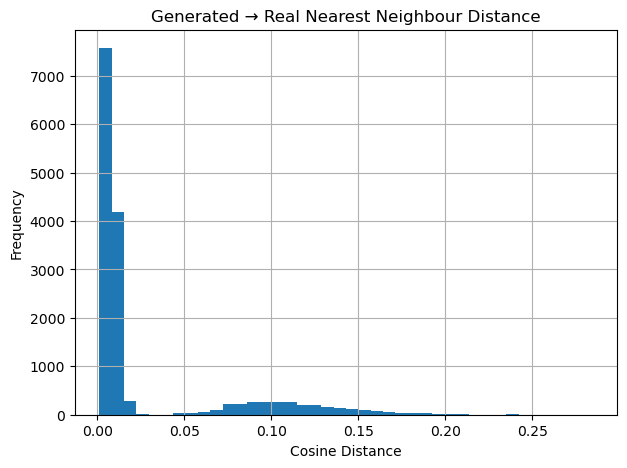

In [25]:
plt.figure(figsize=(7,5))

plt.hist(

    GR["Distance"],

    bins=40

)

plt.xlabel("Cosine Distance")

plt.ylabel("Frequency")

plt.title("Generated → Real Nearest Neighbour Distance")

plt.grid(True)

plt.savefig(

    os.path.join(

        OUTPUT_DIR,

        "Histogram_Generated_to_Real.png"

    ),

    dpi=300,

    bbox_inches='tight'

)

plt.show()

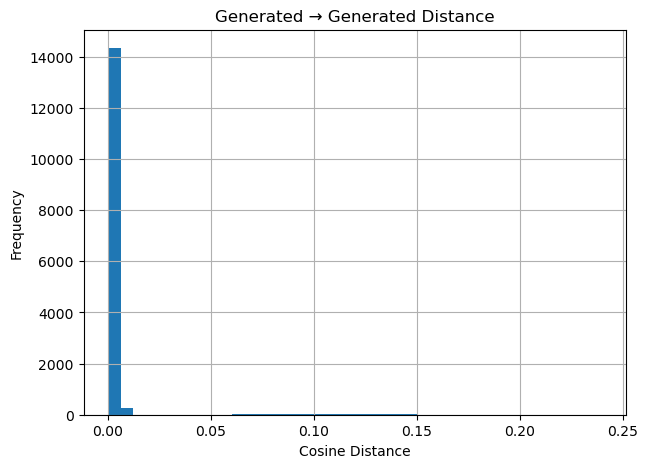

In [26]:
plt.figure(figsize=(7,5))

plt.hist(

    GG["Distance"],

    bins=40

)

plt.xlabel("Cosine Distance")

plt.ylabel("Frequency")

plt.title("Generated → Generated Distance")

plt.grid(True)

plt.savefig(

    os.path.join(

        OUTPUT_DIR,

        "Histogram_Generated_to_Generated.png"

    ),

    dpi=300,

    bbox_inches='tight'

)

plt.show()

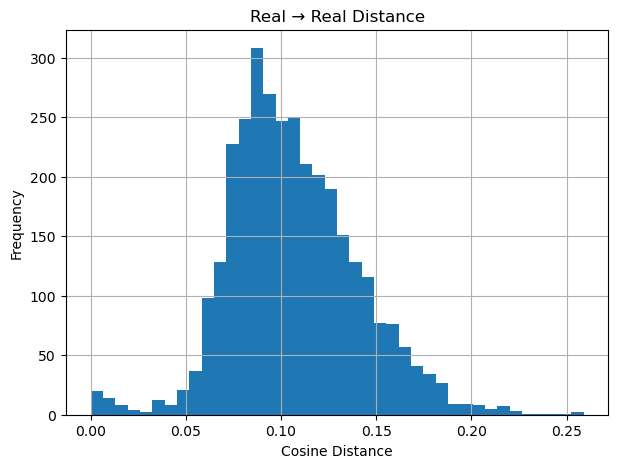

In [27]:
plt.figure(figsize=(7,5))

plt.hist(

    RR["Distance"],

    bins=40

)

plt.xlabel("Cosine Distance")

plt.ylabel("Frequency")

plt.title("Real → Real Distance")

plt.grid(True)

plt.savefig(

    os.path.join(

        OUTPUT_DIR,

        "Histogram_Real_to_Real.png"

    ),

    dpi=300,

    bbox_inches='tight'

)

plt.show()

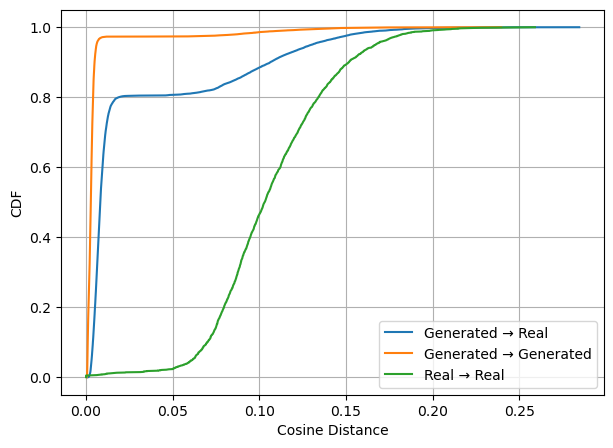

In [28]:
plt.figure(figsize=(7,5))

for df,label in [

    (GR,"Generated → Real"),

    (GG,"Generated → Generated"),

    (RR,"Real → Real")

]:

    x=np.sort(df["Distance"])

    y=np.arange(1,len(x)+1)/len(x)

    plt.plot(x,y,label=label)

plt.xlabel("Cosine Distance")

plt.ylabel("CDF")

plt.legend()

plt.grid(True)

plt.savefig(

    os.path.join(

        OUTPUT_DIR,

        "CDF_All.png"

    ),

    dpi=300,

    bbox_inches='tight'

)

plt.show()

In [29]:
##############################################################
# CLASS-WISE NEAREST NEIGHBOUR ANALYSIS
##############################################################

import pandas as pd
from sklearn.neighbors import NearestNeighbors

GR_rows = []
RR_rows = []
GG_rows = []

classes = sorted(np.unique(real_labels))

print("="*70)
print("Running Class-wise Nearest Neighbour Analysis")
print("="*70)

for cls in classes:

    print(f"\nProcessing Class : {cls}")

    # -------------------------------------------------------
    # Select current class
    # -------------------------------------------------------

    real_idx = np.where(real_labels == cls)[0]
    gen_idx  = np.where(generated_labels == cls)[0]

    real_feat = real_features[real_idx]
    gen_feat  = generated_features[gen_idx]

    real_path = real_paths[real_idx]
    gen_path  = generated_paths[gen_idx]

    ##########################################################
    # Generated -> Real
    ##########################################################

    nn = NearestNeighbors(
        n_neighbors=1,
        metric="cosine",
        algorithm="brute"
    )

    nn.fit(real_feat)

    distances, indices = nn.kneighbors(gen_feat)

    for i in range(len(gen_idx)):

        GR_rows.append({

            "Class": cls,

            "Generated_Path": gen_path[i],

            "Nearest_Real_Path": real_path[indices[i][0]],

            "Nearest_Real_Label": cls,

            "Distance": round(float(distances[i][0]),6),

            "Similarity": round(float(1-distances[i][0]),6)

        })

    ##########################################################
    # Real -> Real
    ##########################################################

    nn = NearestNeighbors(
        n_neighbors=2,
        metric="cosine",
        algorithm="brute"
    )

    nn.fit(real_feat)

    distances, indices = nn.kneighbors(real_feat)

    for i in range(len(real_feat)):

        RR_rows.append({

            "Class": cls,

            "Real_Path": real_path[i],

            "Nearest_Real_Path": real_path[indices[i][1]],

            "Nearest_Real_Label": cls,

            "Distance": round(float(distances[i][1]),6),

            "Similarity": round(float(1-distances[i][1]),6)

        })

    ##########################################################
    # Generated -> Generated
    ##########################################################

    nn = NearestNeighbors(
        n_neighbors=2,
        metric="cosine",
        algorithm="brute"
    )

    nn.fit(gen_feat)

    distances, indices = nn.kneighbors(gen_feat)

    for i in range(len(gen_feat)):

        GG_rows.append({

            "Class": cls,

            "Generated_Path": gen_path[i],

            "Nearest_Generated_Path": gen_path[indices[i][1]],

            "Nearest_Generated_Label": cls,

            "Distance": round(float(distances[i][1]),6),

            "Similarity": round(float(1-distances[i][1]),6)

        })

##############################################################
# SAVE CSV FILES
##############################################################

GR = pd.DataFrame(GR_rows)
RR = pd.DataFrame(RR_rows)
GG = pd.DataFrame(GG_rows)

GR.to_csv(
    os.path.join(FEATURE_DIR, "Generated_to_Real.csv"),
    index=False
)

RR.to_csv(
    os.path.join(FEATURE_DIR, "Real_to_Real.csv"),
    index=False
)

GG.to_csv(
    os.path.join(FEATURE_DIR, "Generated_to_Generated.csv"),
    index=False
)

print("\n")
print("="*70)
print("Nearest Neighbour Analysis Completed")
print("="*70)

print("Generated → Real       :", len(GR))
print("Real → Real            :", len(RR))
print("Generated → Generated  :", len(GG))

print("="*70)

print("\nCSV files saved successfully.")

Running Class-wise Nearest Neighbour Analysis

Processing Class : EarlyBlight

Processing Class : Healthy

Processing Class : LateBlight


Nearest Neighbour Analysis Completed
Generated → Real       : 15000
Real → Real            : 3257
Generated → Generated  : 15000

CSV files saved successfully.


In [30]:
import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from scipy.stats import iqr

#####################################################
# PATH
#####################################################

RESULT_DIR = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\PL-LDGANFOLD2_NN_ANALYSIS"
GR = pd.read_csv(os.path.join(RESULT_DIR,"Generated_to_Real.csv"))
RR = pd.read_csv(os.path.join(RESULT_DIR,"Real_to_Real.csv"))
GG = pd.read_csv(os.path.join(RESULT_DIR,"Generated_to_Generated.csv"))

print("Generated → Real :",len(GR))
print("Real → Real :",len(RR))
print("Generated → Generated :",len(GG))

Generated → Real : 15000
Real → Real : 3257
Generated → Generated : 15000


In [31]:
#############################################################
# TABLE XII
#############################################################

def stats(x):

    return {

        "Mean":np.mean(x),
        "Median":np.median(x),
        "Std":np.std(x),
        "IQR":iqr(x),
        "P1":np.percentile(x,1),
        "P5":np.percentile(x,5),
        "P10":np.percentile(x,10),
        "Maximum":np.max(x)

    }


rows=[]

classes=sorted(GR["Class"].unique())

for cls in classes:

    rows.append({

        "Class":cls,
        "Metric":"Generated → Training Real",

        **stats(

            GR[GR["Class"]==cls]["Distance"]

        )

    })

    rows.append({

        "Class":cls,
        "Metric":"Generated → Generated",

        **stats(

            GG[GG["Class"]==cls]["Distance"]

        )

    })

    rows.append({

        "Class":cls,
        "Metric":"Training Real → Training Real",

        **stats(

            RR[RR["Class"]==cls]["Distance"]

        )

    })


##############################
# Overall
##############################

rows.append({

    "Class":"Overall",
    "Metric":"Generated → Training Real",

    **stats(GR["Distance"])

})

rows.append({

    "Class":"Overall",
    "Metric":"Generated → Generated",

    **stats(GG["Distance"])

})

rows.append({

    "Class":"Overall",
    "Metric":"Training Real → Training Real",

    **stats(RR["Distance"])

})

table12=pd.DataFrame(rows)

table12=table12.round(6)

display(table12)

table12.to_csv(

    os.path.join(RESULT_DIR,"Table_XII.csv"),

    index=False

)

table12.to_excel(

    os.path.join(RESULT_DIR,"Table_XII.xlsx"),

    index=False

)

print("\nTable XII Saved Successfully")

,Class,Metric,Mean,Median,Std,IQR,P1,P5,P10,Maximum
0,EarlyBlight,Generated → Training Real,0.029335,0.008406,0.043748,0.008047,0.002857,0.003869,0.004561,0.246255
1,EarlyBlight,Generated → Generated,0.007846,0.003434,0.021049,0.001609,0.001553,0.001951,0.002215,0.211324
2,EarlyBlight,Training Real → Training Real,0.104901,0.102095,0.028824,0.035559,0.011421,0.069280,0.075178,0.224453
3,Healthy,Generated → Training Real,0.022867,0.006532,0.036413,0.007402,0.001882,0.002580,0.003010,0.241698
4,Healthy,Generated → Generated,0.002186,0.001235,0.007821,0.001006,0.000511,0.000636,0.000723,0.141161
5,Healthy,Training Real → Training Real,0.086309,0.082897,0.026647,0.030715,0.007963,0.051216,0.059347,0.206591
6,LateBlight,Generated → Training Real,0.031760,0.009053,0.050227,0.005605,0.003504,0.004788,0.005664,0.284603
7,LateBlight,Generated → Generated,0.006731,0.003108,0.020388,0.001495,0.001320,0.001716,0.001956,0.239555
8,LateBlight,Training Real → Training Real,0.125908,0.124124,0.035962,0.047187,0.026483,0.075740,0.084617,0.259031
9,Overall,Generated → Training Real,0.027987,0.008164,0.043988,0.007155,0.002261,0.003195,0.003939,0.284603



Table XII Saved Successfully


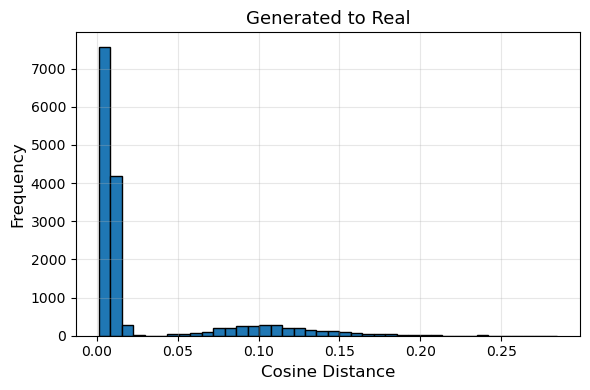

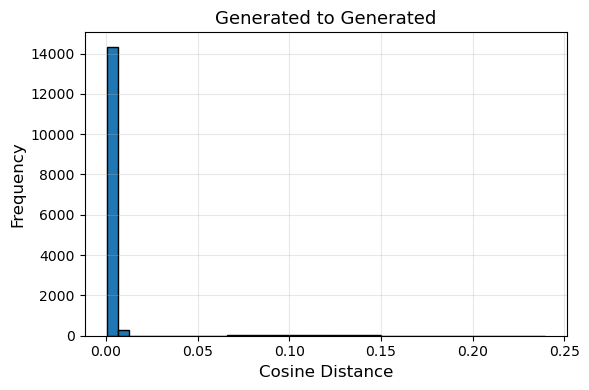

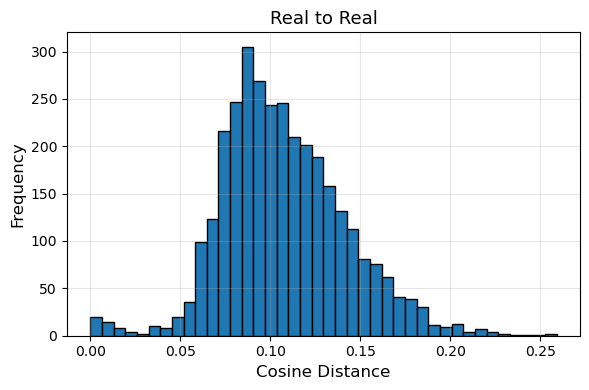

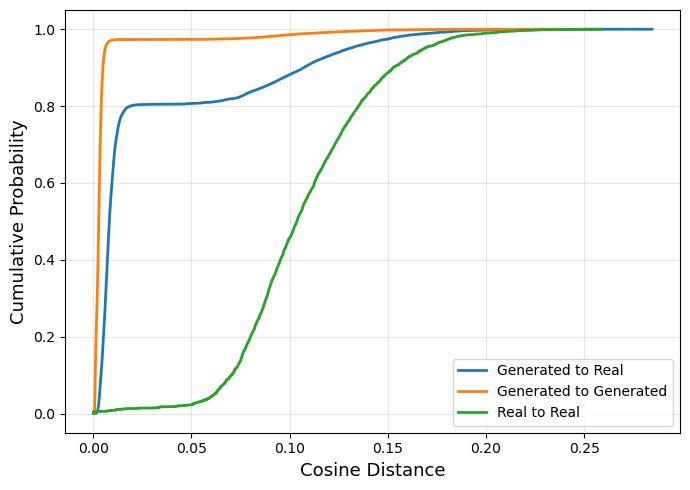


Histogram and CDF Saved Successfully


In [32]:
#############################################################
# HISTOGRAM + CDF
#############################################################

plots=[

    ("Generated_to_Real",GR),

    ("Generated_to_Generated",GG),

    ("Real_to_Real",RR)

]

for name,df in plots:

    ###################################
    # Histogram
    ###################################

    plt.figure(figsize=(6,4))

    plt.hist(

        df["Distance"],

        bins=40,

        edgecolor="black"

    )

    plt.xlabel("Cosine Distance",fontsize=12)

    plt.ylabel("Frequency",fontsize=12)

    plt.title(name.replace("_"," "),fontsize=13)

    plt.grid(alpha=0.3)

    plt.tight_layout()

    plt.savefig(

        os.path.join(

            RESULT_DIR,

            f"{name}_Histogram.png"

        ),

        dpi=600

    )

    plt.show()


###############################################
# Combined CDF
###############################################

plt.figure(figsize=(7,5))

for name,df in plots:

    x=np.sort(df["Distance"])

    y=np.arange(1,len(x)+1)/len(x)

    plt.plot(

        x,

        y,

        linewidth=2,

        label=name.replace("_"," ")

    )

plt.xlabel("Cosine Distance",fontsize=13)

plt.ylabel("Cumulative Probability",fontsize=13)

plt.legend()

plt.grid(alpha=0.3)

plt.tight_layout()

plt.savefig(

    os.path.join(

        RESULT_DIR,

        "Combined_CDF.png"

    ),

    dpi=600

)

plt.show()

print("\nHistogram and CDF Saved Successfully")

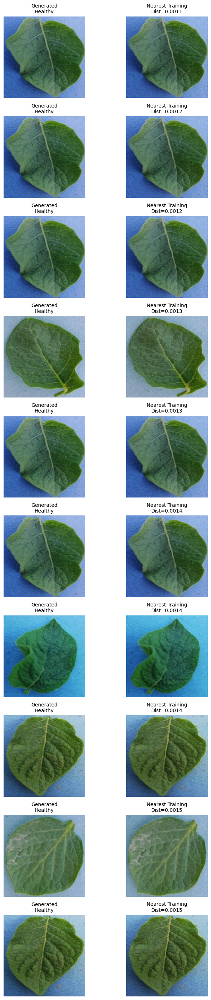

Top-10 Nearest Neighbour Figure Generated
        Class  Distance  Similarity
9313  Healthy  0.001120    0.998880
8406  Healthy  0.001204    0.998796
6727  Healthy  0.001219    0.998781
9533  Healthy  0.001307    0.998693
7557  Healthy  0.001333    0.998667
6098  Healthy  0.001386    0.998614
7773  Healthy  0.001425    0.998575
9033  Healthy  0.001435    0.998565
7998  Healthy  0.001464    0.998536
7795  Healthy  0.001470    0.998530

Saved Files:
Top10_NearestNeighbours.csv
Top10_Generated_vs_Training.png


In [33]:
#############################################################
# NOTEBOOK-4
# TOP-10 GENERATED vs NEAREST TRAINING IMAGE
#############################################################

import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt

RESULT_DIR = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\PL-LDGANFOLD2_NN_ANALYSIS"

csv_file = os.path.join(RESULT_DIR, "Generated_to_Real.csv")

df = pd.read_csv(csv_file)

#############################################################
# Top-10 Closest Images
#############################################################

top10 = df.sort_values("Distance").head(10)

top10.to_csv(
    os.path.join(RESULT_DIR, "Top10_NearestNeighbours.csv"),
    index=False
)

#############################################################
# Plot
#############################################################

fig, axes = plt.subplots(10, 2, figsize=(8, 28))

for i, (_, row) in enumerate(top10.iterrows()):

    gen = cv2.imread(row["Generated_Path"])
    real = cv2.imread(row["Nearest_Real_Path"])

    gen = cv2.cvtColor(gen, cv2.COLOR_BGR2RGB)
    real = cv2.cvtColor(real, cv2.COLOR_BGR2RGB)

    axes[i,0].imshow(gen)
    axes[i,0].set_title(
        f"Generated\n{row['Class']}",
        fontsize=10
    )
    axes[i,0].axis("off")

    axes[i,1].imshow(real)
    axes[i,1].set_title(
        f"Nearest Training\nDist={row['Distance']:.4f}",
        fontsize=10
    )
    axes[i,1].axis("off")

plt.tight_layout()

plt.savefig(
    os.path.join(
        RESULT_DIR,
        "Top10_Generated_vs_Training.png"
    ),
    dpi=600,
    bbox_inches="tight"
)

plt.show()

#############################################################
# Statistics
#############################################################

print("="*70)
print("Top-10 Nearest Neighbour Figure Generated")
print("="*70)

print(top10[[
    "Class",
    "Distance",
    "Similarity"
]])

print("\nSaved Files:")
print("Top10_NearestNeighbours.csv")
print("Top10_Generated_vs_Training.png")

IndexError: index 10 is out of bounds for axis 0 with size 10

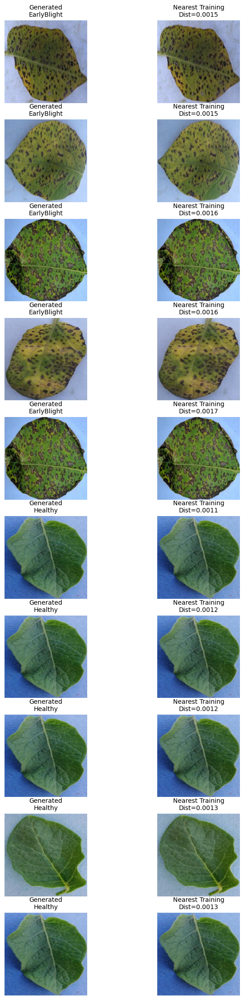

In [34]:
#############################################################
# NOTEBOOK-4
# TOP-10 GENERATED vs NEAREST TRAINING IMAGE
#############################################################

import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt

RESULT_DIR = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\PL-LDGANFOLD2_NN_ANALYSIS"
csv_file = os.path.join(RESULT_DIR, "Generated_to_Real.csv")

df = pd.read_csv(csv_file)

#############################################################
# Top-10 Closest Images
#############################################################

##############################################################
# Top-5 nearest neighbours from EACH class
##############################################################

top_list = []

for cls in sorted(df["Class"].unique()):

    temp = (
        df[df["Class"] == cls]
        .sort_values("Distance")
        .head(5)
    )

    top_list.append(temp)

top10 = pd.concat(top_list, ignore_index=True)

top10.to_csv(
    os.path.join(RESULT_DIR, "Top10_NearestNeighbours.csv"),
    index=False
)

#############################################################
# Plot
#############################################################

fig, axes = plt.subplots(10, 2, figsize=(8, 28))

for i, (_, row) in enumerate(top10.iterrows()):

    gen = cv2.imread(row["Generated_Path"])
    real = cv2.imread(row["Nearest_Real_Path"])

    gen = cv2.cvtColor(gen, cv2.COLOR_BGR2RGB)
    real = cv2.cvtColor(real, cv2.COLOR_BGR2RGB)

    axes[i,0].imshow(gen)
    axes[i,0].set_title(
        f"Generated\n{row['Class']}",
        fontsize=10
    )
    axes[i,0].axis("off")

    axes[i,1].imshow(real)
    axes[i,1].set_title(
        f"Nearest Training\nDist={row['Distance']:.4f}",
        fontsize=10
    )
    axes[i,1].axis("off")

plt.tight_layout()

plt.savefig(
    os.path.join(
        RESULT_DIR,
        "Top10_Generated_vs_Training.png"
    ),
    dpi=600,
    bbox_inches="tight"
)

plt.show()

#############################################################
# Statistics
#############################################################

print("="*70)
print("Top-10 Nearest Neighbour Figure Generated")
print("="*70)

print(top10[[
    "Class",
    "Distance",
    "Similarity"
]])

print("\nSaved Files:")
print("Top10_NearestNeighbours.csv")
print("Top10_Generated_vs_Training.png")

Samples Selected
Class
EarlyBlight    10
Healthy        10
LateBlight     10
dtype: int64


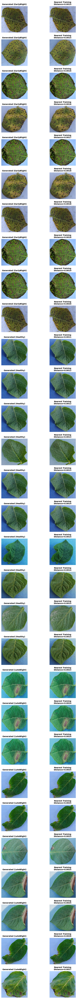



Top-30 Nearest Neighbour Figure Generated Successfully
          Class  Distance  Similarity
0   EarlyBlight  0.001504    0.998496
1   EarlyBlight  0.001537    0.998463
2   EarlyBlight  0.001569    0.998431
3   EarlyBlight  0.001595    0.998405
4   EarlyBlight  0.001690    0.998310
5   EarlyBlight  0.001791    0.998209
6   EarlyBlight  0.001830    0.998170
7   EarlyBlight  0.001832    0.998168
8   EarlyBlight  0.001903    0.998097
9   EarlyBlight  0.001992    0.998008
10      Healthy  0.001120    0.998880
11      Healthy  0.001204    0.998796
12      Healthy  0.001219    0.998781
13      Healthy  0.001307    0.998693
14      Healthy  0.001333    0.998667
15      Healthy  0.001386    0.998614
16      Healthy  0.001425    0.998575
17      Healthy  0.001435    0.998565
18      Healthy  0.001464    0.998536
19      Healthy  0.001470    0.998530
20   LateBlight  0.002333    0.997667
21   LateBlight  0.002350    0.997650
22   LateBlight  0.002392    0.997608
23   LateBlight  0.002454    0.

In [35]:
#############################################################
# NOTEBOOK-4
# TOP-10 NEAREST GENERATED vs TRAINING IMAGE PER CLASS
#############################################################

import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt

# ==========================================================
# PATH
# ==========================================================

RESULT_DIR = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\PL-LDGANFOLD2_NN_ANALYSIS"
csv_file = os.path.join(RESULT_DIR, "Generated_to_Real.csv")

df = pd.read_csv(csv_file)

# ==========================================================
# SELECT TOP-10 FROM EACH CLASS
# ==========================================================

TOP_K = 10

top_list = []

for cls in sorted(df["Class"].unique()):

    temp = (
        df[df["Class"] == cls]
        .sort_values("Distance", ascending=True)
        .head(TOP_K)
    )

    top_list.append(temp)

top_df = pd.concat(top_list, ignore_index=True)

# Save CSV
top_df.to_csv(
    os.path.join(RESULT_DIR, "Top30_NearestNeighbours.csv"),
    index=False
)

print("="*70)
print("Samples Selected")
print("="*70)

print(top_df.groupby("Class").size())

# ==========================================================
# CREATE FIGURE
# ==========================================================

rows = len(top_df)

fig, axes = plt.subplots(rows, 2, figsize=(9, rows*2.5))

if rows == 1:
    axes = [axes]

for i, (_, row) in enumerate(top_df.iterrows()):

    gen = cv2.imread(row["Generated_Path"])
    real = cv2.imread(row["Nearest_Real_Path"])

    gen = cv2.cvtColor(gen, cv2.COLOR_BGR2RGB)
    real = cv2.cvtColor(real, cv2.COLOR_BGR2RGB)

    # Generated image
    axes[i,0].imshow(gen)
    axes[i,0].set_title(
        f"Generated ({row['Class']})",
        fontsize=10,
        fontweight="bold"
    )
    axes[i,0].axis("off")

    # Nearest training image
    axes[i,1].imshow(real)
    axes[i,1].set_title(
        f"Nearest Training\nDistance={row['Distance']:.4f}",
        fontsize=10,
        fontweight="bold"
    )
    axes[i,1].axis("off")

plt.tight_layout()

plt.savefig(
    os.path.join(
        RESULT_DIR,
        "Top30_Generated_vs_Training.png"
    ),
    dpi=600,
    bbox_inches="tight"
)

plt.show()

# ==========================================================
# SUMMARY
# ==========================================================

print("\n")
print("="*70)
print("Top-30 Nearest Neighbour Figure Generated Successfully")
print("="*70)

print(top_df[["Class","Distance","Similarity"]])

print("\nSaved Files")
print("-------------------------------")
print("Top30_NearestNeighbours.csv")
print("Top30_Generated_vs_Training.png")
print("="*70)

In [36]:
!pip install imagehash pillow

  Obtaining dependency information for imagehash from https://files.pythonhosted.org/packages/31/2c/5f0903a53a62029875aaa3884c38070cc388248a2c1b9aa935632669e5a7/ImageHash-4.3.2-py2.py3-none-any.whl.metadata
   ---------------------------------------- 0.0/296.7 kB ? eta -:--:--
   - -------------------------------------- 10.2/296.7 kB ? eta -:--:--
   ----- --------------------------------- 41.0/296.7 kB 653.6 kB/s eta 0:00:01
   -------------------------------------- - 286.7/296.7 kB 2.9 MB/s eta 0:00:01
   ---------------------------------------- 296.7/296.7 kB 2.6 MB/s eta 0:00:00


In [36]:
#############################################################
# NOTEBOOK-5
# DUPLICATE & NEAR-DUPLICATE ANALYSIS
#############################################################

import os
import hashlib
import imagehash
import pandas as pd
from PIL import Image
from itertools import combinations
from tqdm import tqdm

# ==========================================================
# PATHS
# ==========================================================

GENERATED_DIR = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\PL-LDGANGnereated"

RESULT_DIR = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\PL-LDGANFOLD2_NN_ANALYSIS"
os.makedirs(RESULT_DIR, exist_ok=True)

PHASH_THRESHOLD = 5      # <=5 considered near-duplicate

#############################################################
# READ ALL GENERATED IMAGES
#############################################################

image_files = []

for root, _, files in os.walk(GENERATED_DIR):

    for f in files:

        if f.lower().endswith((".jpg",".jpeg",".png",".bmp",".tif",".tiff")):

            image_files.append(os.path.join(root,f))

print(f"Total Generated Images : {len(image_files)}")

#############################################################
# MD5 + PHASH
#############################################################

records = []

for path in tqdm(image_files):

    with open(path,"rb") as f:
        md5 = hashlib.md5(f.read()).hexdigest()

    phash = imagehash.phash(Image.open(path))

    cls = os.path.basename(os.path.dirname(path))

    records.append({

        "Class":cls,

        "Image":path,

        "MD5":md5,

        "pHash":str(phash)

    })

df = pd.DataFrame(records)

#############################################################
# EXACT DUPLICATES (MD5)
#############################################################

exact_duplicates = df[df.duplicated("MD5", keep=False)]

#############################################################
# NEAR DUPLICATES (pHash)
#############################################################

near_duplicates = []

for cls in sorted(df["Class"].unique()):

    temp = df[df["Class"]==cls].reset_index(drop=True)

    hashes = [imagehash.hex_to_hash(h) for h in temp["pHash"]]

    for i,j in combinations(range(len(temp)),2):

        dist = hashes[i]-hashes[j]

        if dist <= PHASH_THRESHOLD:

            near_duplicates.append({

                "Class":cls,

                "Image1":temp.loc[i,"Image"],

                "Image2":temp.loc[j,"Image"],

                "pHash_Distance":dist

            })

near_duplicates = pd.DataFrame(near_duplicates)

#############################################################
# SAVE REPORTS
#############################################################

exact_duplicates.to_csv(

    os.path.join(
        RESULT_DIR,
        "Exact_Duplicates_MD5.csv"
    ),

    index=False
)

near_duplicates.to_csv(

    os.path.join(
        RESULT_DIR,
        "Near_Duplicates_pHash.csv"
    ),

    index=False
)

#############################################################
# SUMMARY
#############################################################

total = len(df)

exact = len(exact_duplicates)

near = len(near_duplicates)

print("\n"+"="*70)
print("Duplicate Analysis Summary")
print("="*70)

print(f"Total Generated Images      : {total}")

print(f"Exact Duplicate Images      : {exact}")

print(f"Near Duplicate Pairs        : {near}")

print(f"Exact Duplicate Rate (%)    : {100*exact/total:.4f}")

print(f"Near Duplicate Rate (%)     : {100*near/total:.4f}")

print("="*70)

print("\nSaved Files")

print("----------------------------")

print("Exact_Duplicates_MD5.csv")

print("Near_Duplicates_pHash.csv")

Total Generated Images : 15000


100%|███████████████████████████████████████████████████████████████████████████| 15000/15000 [00:56<00:00, 267.40it/s]



Duplicate Analysis Summary
Total Generated Images      : 15000
Exact Duplicate Images      : 0
Near Duplicate Pairs        : 29492
Exact Duplicate Rate (%)    : 0.0000
Near Duplicate Rate (%)     : 196.6133

Saved Files
----------------------------
Exact_Duplicates_MD5.csv
Near_Duplicates_pHash.csv


Computing MD5 and pHash...


100%|███████████████████████████████████████████████████████████████████████████| 15000/15000 [01:10<00:00, 212.11it/s]



Duplicate Analysis Summary
Total Generated Images            : 15000
Exact Duplicate Images (MD5)      : 0
Exact Duplicate Rate (%)          : 0.0000
Near-Duplicate Images (pHash<=5)  : 12075
Near-Duplicate Rate (%)           : 80.5000


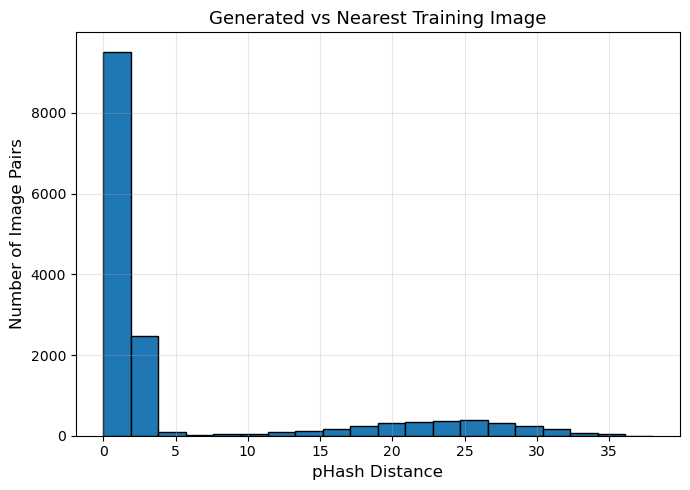


Top-10 closest pHash pairs saved.
NearestNeighbour_Duplicate_Report.csv
Top10_pHash_NearestPairs.csv
pHash_Distance_Histogram.png


In [37]:
#############################################################
# NOTEBOOK-5
# MD5 + pHash Analysis of Generated vs Nearest Training Image
#############################################################

import os
import hashlib
import imagehash
import pandas as pd
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

#############################################################
# PATH
#############################################################

RESULT_DIR = r"D:\SAMPLEVISITPICS\FirstPaper\THIRDPAPER\POTATO RESEARCH\POTATODATASET\PLD_3_Classes_256\PL-LDGANFOLD2_NN_ANALYSIS"

CSV_FILE = os.path.join(RESULT_DIR, "Generated_to_Real.csv")

PHASH_THRESHOLD = 5

#############################################################

df = pd.read_csv(CSV_FILE)

records = []

print("Computing MD5 and pHash...")

for _, row in tqdm(df.iterrows(), total=len(df)):

    gen_path = row["Generated_Path"]
    real_path = row["Nearest_Real_Path"]

    # ---------------- MD5 ----------------

    with open(gen_path, "rb") as f:
        md5_gen = hashlib.md5(f.read()).hexdigest()

    with open(real_path, "rb") as f:
        md5_real = hashlib.md5(f.read()).hexdigest()

    exact_duplicate = (md5_gen == md5_real)

    # ---------------- pHash ----------------

    phash_gen = imagehash.phash(Image.open(gen_path))

    phash_real = imagehash.phash(Image.open(real_path))

    phash_distance = phash_gen - phash_real

    near_duplicate = (phash_distance <= PHASH_THRESHOLD)

    records.append({

        "Class": row["Class"],

        "Generated_Path": gen_path,

        "Nearest_Real_Path": real_path,

        "Feature_Distance": row["Distance"],

        "Similarity": row["Similarity"],

        "MD5_Match": exact_duplicate,

        "pHash_Distance": phash_distance,

        "Near_Duplicate": near_duplicate

    })

#############################################################

report = pd.DataFrame(records)

report.to_csv(

    os.path.join(
        RESULT_DIR,
        "NearestNeighbour_Duplicate_Report.csv"
    ),

    index=False

)

#############################################################
# SUMMARY
#############################################################

total = len(report)

exact = report["MD5_Match"].sum()

near = report["Near_Duplicate"].sum()

print("\n"+"="*70)
print("Duplicate Analysis Summary")
print("="*70)

print(f"Total Generated Images            : {total}")
print(f"Exact Duplicate Images (MD5)      : {exact}")
print(f"Exact Duplicate Rate (%)          : {100*exact/total:.4f}")

print(f"Near-Duplicate Images (pHash<=5)  : {near}")
print(f"Near-Duplicate Rate (%)           : {100*near/total:.4f}")

print("="*70)

#############################################################
# pHash Histogram
#############################################################

plt.figure(figsize=(7,5))

plt.hist(report["pHash_Distance"], bins=20, edgecolor="black")

plt.xlabel("pHash Distance", fontsize=12)
plt.ylabel("Number of Image Pairs", fontsize=12)
plt.title("Generated vs Nearest Training Image", fontsize=13)

plt.grid(alpha=0.3)

plt.tight_layout()

plt.savefig(

    os.path.join(
        RESULT_DIR,
        "pHash_Distance_Histogram.png"
    ),

    dpi=600

)

plt.show()

#############################################################
# TOP-10 CLOSEST PHASH PAIRS
#############################################################

top10 = report.sort_values("pHash_Distance").head(10)

top10.to_csv(

    os.path.join(
        RESULT_DIR,
        "Top10_pHash_NearestPairs.csv"
    ),

    index=False

)

print("\nTop-10 closest pHash pairs saved.")
print("NearestNeighbour_Duplicate_Report.csv")
print("Top10_pHash_NearestPairs.csv")
print("pHash_Distance_Histogram.png")